In [2]:
! pip install kaggle

In [3]:
! mkdir ~/.kaggle


In [4]:
! cp kaggle.json ~/.kaggle/

In [5]:
! chmod 600 ~/.kaggle/kaggle.json


In [6]:
!pip install --upgrade --force-reinstall --no-deps kaggle

     |████████████████████████████████| 58 kB 2.8 MB/s 
  Created wheel for kaggle: filename=kaggle-1.5.12-py3-none-any.whl size=73051 sha256=a475e41a0d46ed8b362df18253638ee8fc1a68fc17e2e0a68ffc20c1980c6613
  Stored in directory: /root/.cache/pip/wheels/62/d6/58/5853130f941e75b2177d281eb7e44b4a98ed46dd155f556dc5
Successfully built kaggle
  Attempting uninstall: kaggle
    Found existing installation: kaggle 1.5.12
    Uninstalling kaggle-1.5.12:
      Successfully uninstalled kaggle-1.5.12


In [7]:
!kaggle competitions download -c cassava-leaf-disease-classification

100% 5.76G/5.76G [01:55<00:00, 52.8MB/s]
100% 5.76G/5.76G [01:55<00:00, 53.7MB/s]


In [8]:
!unzip cassava-leaf-disease-classification

Streaming output truncated to the last 5000 lines.
  inflating: train_images/3954487465.jpg  
  inflating: train_images/3954910918.jpg  
  inflating: train_images/3955391972.jpg  
  inflating: train_images/3955442838.jpg  
  inflating: train_images/3955739563.jpg  
  inflating: train_images/3955931830.jpg  
  inflating: train_images/3955972139.jpg  
  inflating: train_images/3956075690.jpg  
  inflating: train_images/3956077728.jpg  
  inflating: train_images/3956155774.jpg  
  inflating: train_images/3956271103.jpg  
  inflating: train_images/3956372146.jpg  
  inflating: train_images/3956407201.jpg  
  inflating: train_images/3956550570.jpg  
  inflating: train_images/3956605397.jpg  
  inflating: train_images/3956778160.jpg  
  inflating: train_images/3957562076.jpg  
  inflating: train_images/3957612771.jpg  
  inflating: train_images/3957807023.jpg  
  inflating: train_images/3957819631.jpg  
  inflating: train_images/395820132.jpg  
  inflating: train_images/3958304403.jpg  
  in

In [9]:
import os
import glob
import shutil
import json
import keras
import itertools
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf
from PIL import Image
import matplotlib.pyplot as plt
from collections import Counter
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import RMSprop, Adam, SGD
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
# Defining the working directories

#work_dir = '../input/cassava-leaf-disease-classification/'
#os.listdir(work_dir) 
train_path = '/content/train_images'



In [10]:
#%% IMPORTING DATA

# Importing train.csv

data = pd.read_csv('/content/train.csv')
print(Counter(data['label'])) # Checking the frequencies of the labels


Counter({3: 13158, 4: 2577, 2: 2386, 1: 2189, 0: 1087})


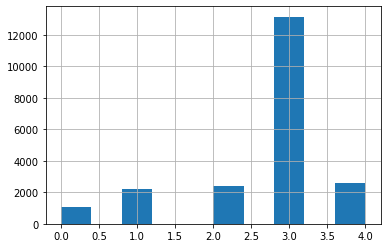

In [11]:
data['label'].hist()

In [12]:
# Importing the json file with labels

f = open('/content/label_num_to_disease_map.json')
real_labels = json.load(f)
real_labels = {int(k):v for k,v in real_labels.items()}

# Defining the working dataset
data['class_name'] = data.label.map(real_labels)
print(data.head(10))
print(data['class_name'].unique())

         image_id  label                           class_name
0  1000015157.jpg      0       Cassava Bacterial Blight (CBB)
1  1000201771.jpg      3         Cassava Mosaic Disease (CMD)
2   100042118.jpg      1  Cassava Brown Streak Disease (CBSD)
3  1000723321.jpg      1  Cassava Brown Streak Disease (CBSD)
4  1000812911.jpg      3         Cassava Mosaic Disease (CMD)
5  1000837476.jpg      3         Cassava Mosaic Disease (CMD)
6  1000910826.jpg      2           Cassava Green Mottle (CGM)
7  1001320321.jpg      0       Cassava Bacterial Blight (CBB)
8  1001723730.jpg      4                              Healthy
9  1001742395.jpg      3         Cassava Mosaic Disease (CMD)
['Cassava Bacterial Blight (CBB)' 'Cassava Mosaic Disease (CMD)'
 'Cassava Brown Streak Disease (CBSD)' 'Cassava Green Mottle (CGM)'
 'Healthy']


In [13]:
def showImages(images):

    # Extract 16 random images from it
    random_images = [np.random.choice(images) for i in range(16)]

    # Adjust the size of your images
    plt.figure(figsize=(16,12))

    # Iterate and plot random images
    for i in range(16):
        plt.subplot(4,4, i + 1)
        img = plt.imread(train_path+'/'+random_images[i])
        plt.imshow(img, cmap='gray')
        plt.axis('off')

    # Adjust subplot parameters to give specified padding
    plt.tight_layout()  

In [14]:
mask = data['label'] ==4
classHealthy = data[mask]

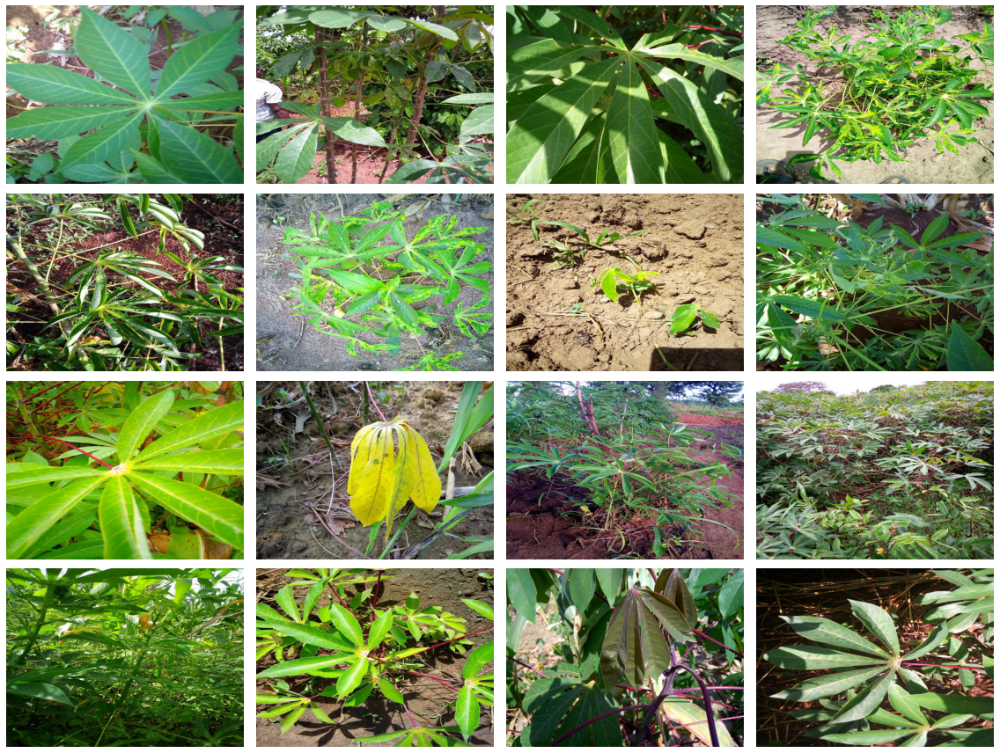

In [15]:
showImages(classHealthy['image_id'])

In [16]:
mask = data['label'] ==3
classCMD = data[mask]

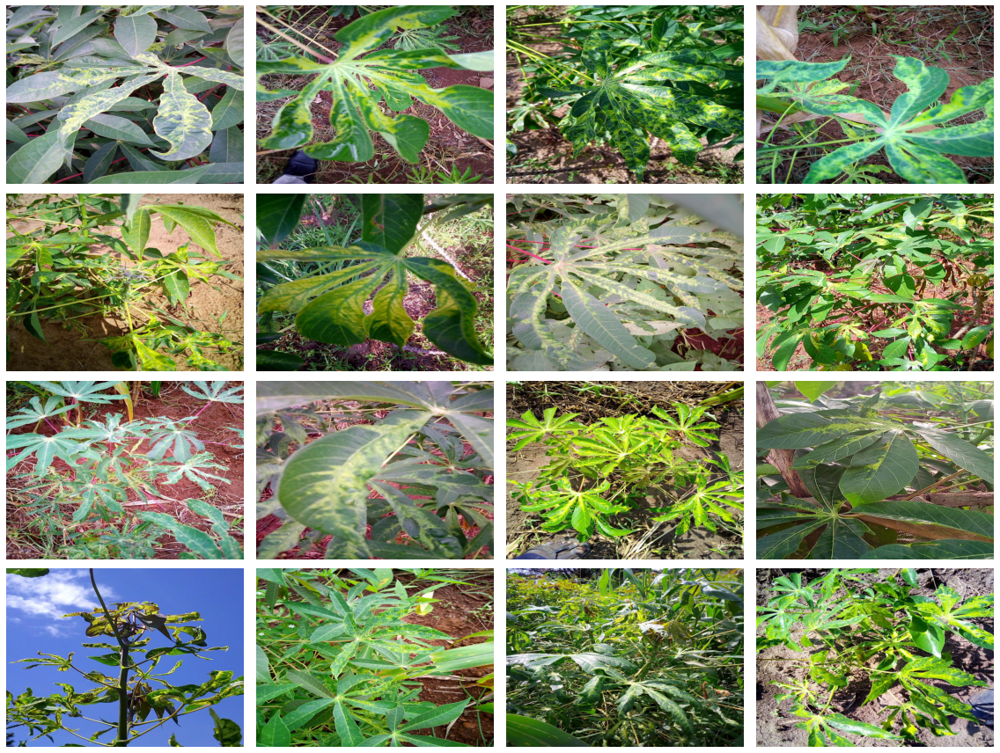

In [17]:
showImages(classCMD['image_id'])

In [18]:
mask = data['label'] ==2
classCGM = data[mask]

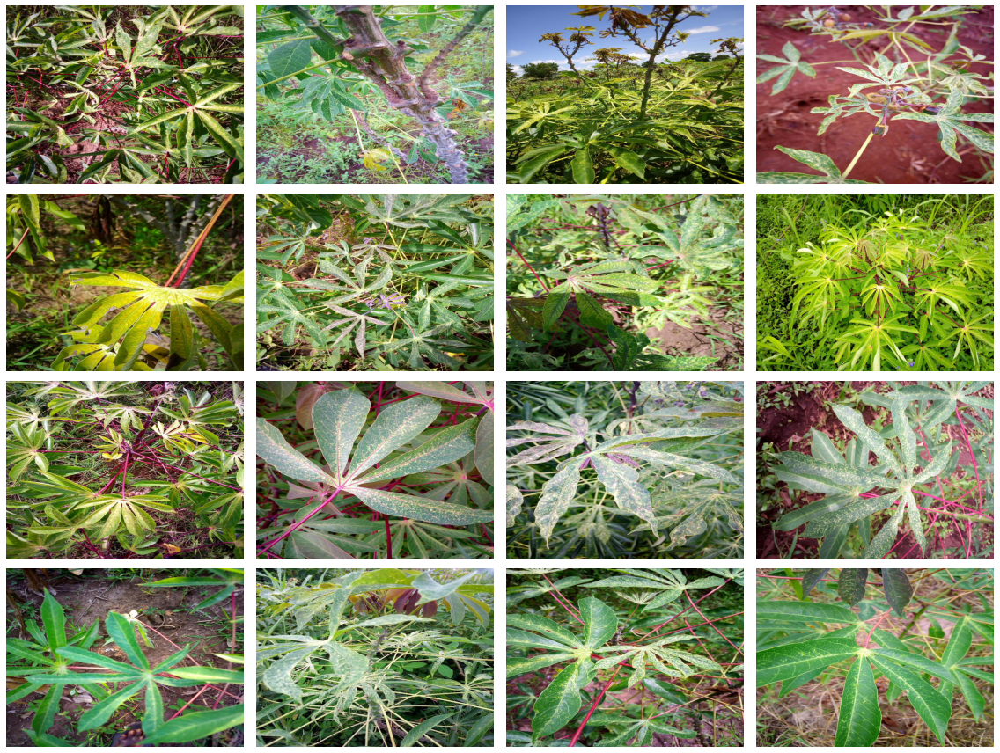

In [19]:
showImages(classCGM['image_id'])

In [20]:
mask = data['label'] ==1
classCBSD = data[mask]

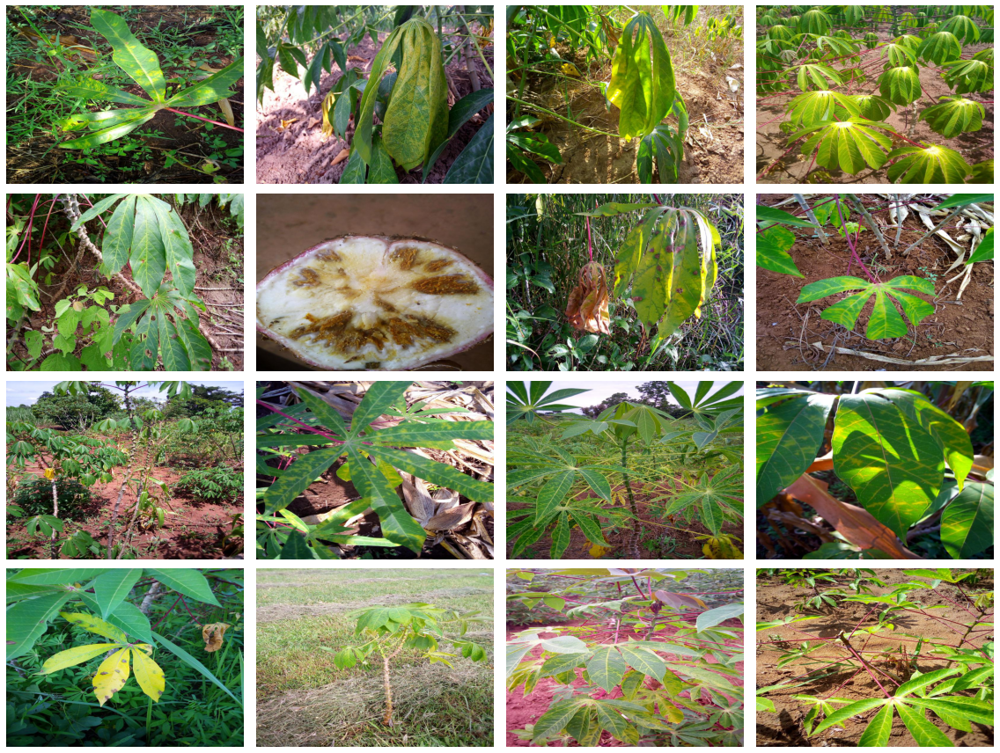

In [21]:
showImages(classCBSD['image_id'])

In [22]:
mask = data['label'] ==0
classCBB = data[mask]

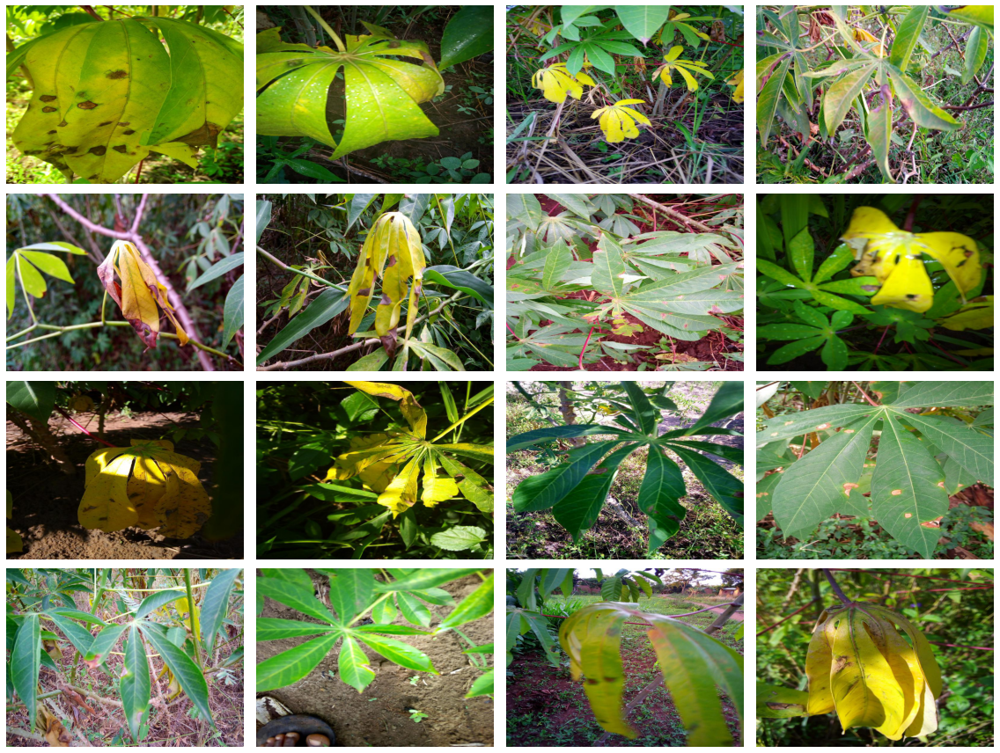

In [23]:
showImages(classCBB['image_id'])

In [24]:
class0 = classCBB.sample(frac=0.99)
class1 = classCBSD.sample(frac=0.9)
class2 = classCGM.sample(frac=0.9)
class3 = classCMD.sample(frac=0.2)
class4 = classHealthy.sample(frac=0.9)




frames=[class0,class1,class2,class3,class4]
finalData = pd.concat(frames)
finalData.head(10)
print(len(finalData))

# Spliting the data
from sklearn.model_selection import train_test_split

train,val = train_test_split(finalData, test_size = 0.05, random_state = 42, stratify = finalData['class_name'])

# Importing the data using ImageDataGenerator

from keras.preprocessing.image import ImageDataGenerator

IMG_SIZE = 300
size = (IMG_SIZE,IMG_SIZE)
n_CLASS = 5

datagen = ImageDataGenerator(
                    preprocessing_function = tf.keras.applications.efficientnet.preprocess_input,
                    rotation_range = 60,
                    width_shift_range = 0.2,
                    height_shift_range = 0.2,
                    shear_range = 0.2,
                    zoom_range = 0.2,
                    horizontal_flip = True,
                    vertical_flip = True,
                    fill_mode = 'nearest')

train_set = datagen.flow_from_dataframe(train,
                         directory = train_path,
                         seed=42,
                         x_col = 'image_id',
                         y_col = 'class_name',
                         target_size = size,
                         class_mode = 'categorical',
                         interpolation = 'nearest',
                         shuffle = True,
                         batch_size = 16)

val_set = datagen.flow_from_dataframe(val,
                         directory = train_path,
                         seed=42,
                         x_col = 'image_id',
                         y_col = 'class_name',
                         target_size = size,
                         class_mode = 'categorical',
                         interpolation = 'nearest',
                         shuffle = True,
                         batch_size = 16)

10144
Found 9636 validated image filenames belonging to 5 classes.
Found 508 validated image filenames belonging to 5 classes.


In [25]:
def create_model():
    
    model = Sequential()
    # initialize the model with input shape as (224,224,3)
    model.add(tf.keras.applications.EfficientNetB3(input_shape = (IMG_SIZE, IMG_SIZE, 3), include_top = False, weights = 'imagenet' ))
    model.add(GlobalAveragePooling2D())
    model.add(Flatten())
    model.add(Dense(256, activation = 'relu', bias_regularizer=tf.keras.regularizers.L1L2(l1=0.01, l2=0.001)))
    model.add(Dropout(0.7))
    model.add(Dense(32, activation = 'relu', bias_regularizer=tf.keras.regularizers.L1L2(l1=0.01, l2=0.001)))
    model.add(Dropout(0.7))
    model.add(Dense(n_CLASS, activation = 'softmax'))
    
    return model

leaf_model = create_model()
leaf_model.summary()

43950080/43941136 [==============================] - 1s 0us/step
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb3 (Functional)  (None, 10, 10, 1536)     10783535  
                                                                 
 global_average_pooling2d (G  (None, 1536)             0         
 lobalAveragePooling2D)                                          
                                                                 
 flatten (Flatten)           (None, 1536)              0         
                                                                 
 dense (Dense)               (None, 256)               393472    
                                                                 
 dropout (Dropout)           (None, 256)               0         
                                                                 
 dense_1 (Dense)             (None, 32)                82

In [26]:
EPOCHS = 5
STEP_SIZE_TRAIN = train_set.n//train_set.batch_size
STEP_SIZE_VALID = val_set.n//val_set.batch_size

In [27]:
#%% FITTING THE MODEL

def Model_fit():
    
    #leaf_model = None
    
    leaf_model = create_model()
    
    '''Compiling the model'''
    
    loss = tf.keras.losses.CategoricalCrossentropy(from_logits = False,
                                                   label_smoothing=0.001,
                                                   name='categorical_crossentropy' )
    
    leaf_model.compile(optimizer = Adam(learning_rate = 2e-4),
                        loss = loss, #'categorical_crossentropy'
                        metrics = ['categorical_accuracy']) #'acc'
    
    # Stop training when the val_loss has stopped decreasing for 5 epochs.
    es = EarlyStopping(monitor='val_loss', mode='min', patience=5,
                       restore_best_weights=True, verbose=1)
    
    # Save the model with the minimum validation loss
    checkpoint_cb = ModelCheckpoint("Cassava_best_modelEffNetB3.h5",
                                    save_best_only=True,
                                    monitor = 'val_loss',
                                    mode='min')
    
    # reduce learning rate
    reduce_lr = ReduceLROnPlateau(monitor = 'val_loss',
                                  factor = 0.3,
                                  patience = 3,
                                  min_lr = 1e-6,
                                  mode = 'min',
                                  verbose = 1)
    
    history = leaf_model.fit(train_set,
                             validation_data = val_set,
                             epochs= EPOCHS,
                             batch_size = 32,
                             steps_per_epoch = STEP_SIZE_TRAIN,
                             validation_steps = STEP_SIZE_VALID,
                             callbacks=[es, checkpoint_cb, reduce_lr])
    
    leaf_model.save('Cassava_modelEffNetB3'+'.h5')  
    
    return history

In [28]:
history = Model_fit()     


Epoch 1/5
602/602 [==============================] - ETA: 0s - loss: 1.4918 - categorical_accuracy: 0.3500

/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


602/602 [==============================] - 722s 1s/step - loss: 1.4918 - categorical_accuracy: 0.3500 - val_loss: 1.1096 - val_categorical_accuracy: 0.5363 - lr: 2.0000e-04
Epoch 2/5
602/602 [==============================] - 690s 1s/step - loss: 1.2485 - categorical_accuracy: 0.5032 - val_loss: 0.8441 - val_categorical_accuracy: 0.7016 - lr: 2.0000e-04
Epoch 3/5
602/602 [==============================] - 684s 1s/step - loss: 1.1505 - categorical_accuracy: 0.5674 - val_loss: 0.8171 - val_categorical_accuracy: 0.7278 - lr: 2.0000e-04
Epoch 4/5
602/602 [==============================] - 683s 1s/step - loss: 1.0741 - categorical_accuracy: 0.6027 - val_loss: 0.7506 - val_categorical_accuracy: 0.7298 - lr: 2.0000e-04
Epoch 5/5
602/602 [==============================] - 683s 1s/step - loss: 1.0430 - categorical_accuracy: 0.6264 - val_loss: 0.7053 - val_categorical_accuracy: 0.7399 - lr: 2.0000e-04


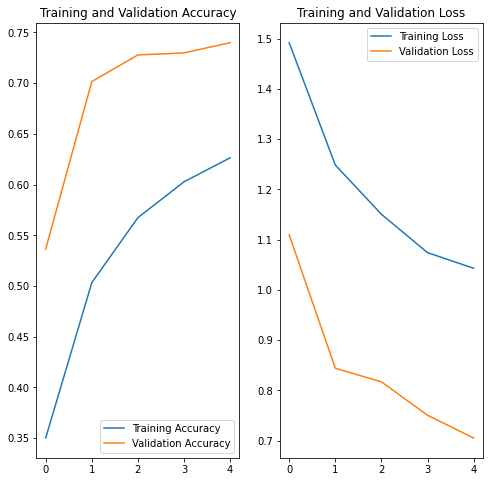

In [29]:
acc = history.history['categorical_accuracy']
val_acc = history.history['val_categorical_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [30]:
import keras

final_model = keras.models.load_model('Cassava_best_modelEffNetB3.h5')

In [32]:
# Importing the json file with labels

f = open('/content/label_num_to_disease_map.json')
real_labels = json.load(f)
real_labels = {int(k):v for k,v in real_labels.items()}

# Defining the working dataset
data['class_name'] = data.label.map(real_labels)

class0 = classCBB.sample(frac=0.99)
class1 = classCBSD.sample(frac=0.7)
class2 = classCGM.sample(frac=0.7)
class3 = classCMD.sample(frac=0.7)
class4 = classHealthy.sample(frac=0.7)




frames=[class0,class1,class2,class3,class4]
finalData = pd.concat(frames)
finalData.head(10)
print(len(finalData))

# Spliting the data
from sklearn.model_selection import train_test_split

train,val = train_test_split(finalData, test_size = 0.1, random_state = 40, stratify = finalData['class_name'])

# Importing the data using ImageDataGenerator

from keras.preprocessing.image import ImageDataGenerator

IMG_SIZE = 300 
size = (IMG_SIZE,IMG_SIZE)
n_CLASS = 5

datagen = ImageDataGenerator(
                    preprocessing_function = tf.keras.applications.efficientnet.preprocess_input,
                    rotation_range =40,
                    width_shift_range = 0.2,
                    height_shift_range = 0.2,
                    shear_range = 0.2,
                    zoom_range = 0.2,
                    horizontal_flip = True,
                    vertical_flip = True,
                    fill_mode = 'nearest')

train_set = datagen.flow_from_dataframe(train,
                         directory = train_path,
                         seed= 40,
                         x_col = 'image_id',
                         y_col = 'class_name',
                         target_size = size,
                         #color_mode="rgb",
                         class_mode = 'categorical',
                         interpolation = 'nearest',
                         shuffle = True,
                         batch_size = 16)
valDatagen = ImageDataGenerator(
                    preprocessing_function = tf.keras.applications.efficientnet.preprocess_input
                    )

val_set = valDatagen.flow_from_dataframe(val,
                         directory = train_path,
                         seed=40,
                         x_col = 'image_id',
                         y_col = 'class_name',
                         target_size = size,
                         #color_mode="rgb",
                         class_mode = 'categorical',
                         interpolation = 'nearest',
                         shuffle = True,
                         batch_size = 16)

15293
Found 13763 validated image filenames belonging to 5 classes.
Found 1530 validated image filenames belonging to 5 classes.


In [33]:
EPOCHS = 3
STEP_SIZE_TRAIN = train_set.n//train_set.batch_size
STEP_SIZE_VALID = val_set.n//val_set.batch_size

In [34]:
def Model_fit1(model):
    
    leaf_model = model
    
    
    '''Compiling the model'''
    
    loss = tf.keras.losses.CategoricalCrossentropy(from_logits = False,
                                                   label_smoothing=0.01,
                                                   name='categorical_crossentropy' )
    
    leaf_model.compile(optimizer =  Adam(learning_rate = 2e-4),
                        loss = loss, #'categorical_crossentropy'
                        metrics = ['categorical_accuracy']) #'acc'
    
    # Stop training when the val_loss has stopped decreasing for 5 epochs.
    es = EarlyStopping(monitor='val_loss', mode='min', patience=5,
                       restore_best_weights=True, verbose=1)
    
    # Save the model with the minimum validation loss
    checkpoint_cb = ModelCheckpoint("Cassava_best_modelEffNetB3v3.h5",
                                    save_best_only=True,
                                    monitor = 'categorical_accuracy',
                                    mode='max')
    
    # reduce learning rate
    reduce_lr = ReduceLROnPlateau(monitor = 'val_loss',
                                  factor = 0.1,
                                  patience = 2,
                                  min_lr = 1e-6,
                                  mode = 'min',
                                  verbose = 1)
    
    history = leaf_model.fit(train_set,
                             validation_data = val_set,
                             epochs= EPOCHS,
                             batch_size = 16,
                             steps_per_epoch = STEP_SIZE_TRAIN,
                             validation_steps = STEP_SIZE_VALID,
                             callbacks=[es, checkpoint_cb, reduce_lr])
    
    leaf_model.save('Cassava_modelEffNetB3v3'+'.h5')  
    
    return history

In [35]:
Model_fit1(final_model)     

Epoch 1/3
860/860 [==============================] - ETA: 0s - loss: 0.7910 - categorical_accuracy: 0.7482

/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


860/860 [==============================] - 1008s 1s/step - loss: 0.7910 - categorical_accuracy: 0.7482 - val_loss: 0.5369 - val_categorical_accuracy: 0.8296 - lr: 2.0000e-04
Epoch 2/3
860/860 [==============================] - 992s 1s/step - loss: 0.7365 - categorical_accuracy: 0.7721 - val_loss: 0.5068 - val_categorical_accuracy: 0.8625 - lr: 2.0000e-04
Epoch 3/3
860/860 [==============================] - 986s 1s/step - loss: 0.7093 - categorical_accuracy: 0.7813 - val_loss: 0.5187 - val_categorical_accuracy: 0.8447 - lr: 2.0000e-04


In [36]:
# Evaluating the model

#%% IMPORTING LIBRARIES 

import os
import glob
import shutil
import json
import keras
import itertools
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf
from PIL import Image
import matplotlib.pyplot as plt
from collections import Counter


In [37]:
final_model2 = keras.models.load_model('/content/Cassava_best_modelEffNetB3v3.h5')

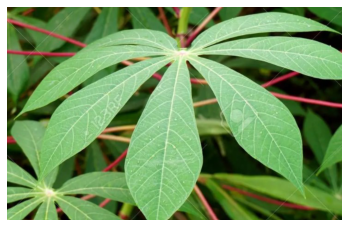

[[0.00826176 0.00387983 0.00227418 0.00206277 0.98352146]]


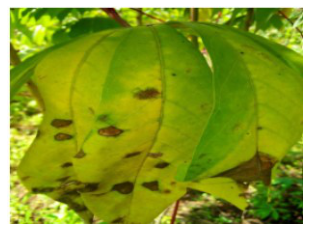

[[0.8186271  0.10391058 0.0041862  0.01373126 0.05954487]]


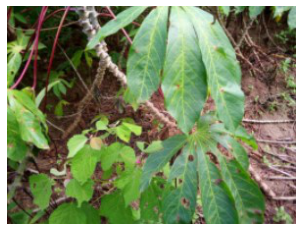

[[0.16173068 0.18571535 0.14303425 0.30083165 0.20868807]]


In [65]:
TEST_DIR = '/content/test_image/'
test_images = os.listdir(TEST_DIR)
predictions = []
IMG_SIZE = 380
IMG_SIZE1 = 300
size = (IMG_SIZE,IMG_SIZE)
size1= (IMG_SIZE1,IMG_SIZE1)
for image in test_images:
    '''
    img = Image.open(TEST_DIR + image)
    img = img.resize(size)
    img = np.expand_dims(img, axis=0)
    prediction1 = final_model1.predict(img)
    print(prediction1)
    '''
    img1 = Image.open(TEST_DIR + image)
    img1 = img1.resize(size1)
    img1 = np.expand_dims(img1, axis=0)
    prediction2 = final_model2.predict(img1)

   
    img = plt.imread(TEST_DIR+image)
    plt.imshow(img, cmap='gray')
    plt.axis('off')
    plt.show()
    
    print(prediction2)
    #result = prediction1 + prediction2
    #print(result)
    #predictions.extend(result.argmax(axis = 1))
    predictions.extend(prediction2.argmax(axis = 1))